# 04 Hausdorff 95 distance calculation


Kernel: `glioma-loc-long` on MacOS (--> segment-glioma (Python 3.11.9)`)

Arvid Lundervold & Marianne Hannisdal  

Last updated: **2025-03-13**  

### Import libraries we will use

In [1]:
# Import libraries
import os
import os.path as op
import glob
import shutil
import subprocess as subp
import pathlib
import platform
import shutil
import IPython
from datetime import date
import warnings
import numpy as np
import pandas as pd
from tqdm import tqdm
import nibabel as nib
from nibabel.viewers import OrthoSlicer3D
import nilearn
from nilearn import plotting
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import pickle
import pydicom
from pydicom import dcmread
# import imageio
import imageio.v2 as imageio
from scipy import ndimage
from scipy.ndimage import zoom
from scipy.ndimage import distance_transform_edt

%matplotlib inline
home = os.path.expanduser('~')            # To make a path to local home directory
                       
warnings.filterwarnings('ignore')         # To ignore warnings

In [2]:
print(f'platform: {platform.platform()}')
print(f'python version: {platform.python_version()}')
print(f'pydicom version: {pydicom.__version__}')
print(f'nibabel version: {nib.__version__}')
print(f'nilearn version: {nilearn.__version__}')
print(f'pandas version: {pd.__version__}')
print(f'numpy version: {np.__version__}')
print(f'seaborn version: {sns.__version__}')

platform: Linux-6.8.0-45-generic-x86_64-with-glibc2.39
python version: 3.11.9
pydicom version: 2.4.4
nibabel version: 5.2.1
nilearn version: 0.10.4
pandas version: 2.2.2
numpy version: 1.26.4
seaborn version: 0.13.2


In [3]:
verbose = True

**Define directory paths:**

In [ ]:

if platform.system() == 'Darwin':
    print(f'OK, you are running on MacOS ({platform.version()})')
    PRJ_DIR = f'{home}/prj/glioma-recurrence'

if platform.system() == 'Linux':
    PRJ_DIR = f"{os.path.expanduser('~')}/prj/glioma_recurrence/glioma_recurrence/data"
    

SITE = '10' 
easyreg_dir = f'{PRJ_DIR}/{SITE}/easyreg_1'
REGISTERED = f'{PRJ_DIR}/{SITE}/registered'
SEGMENT_GLIOMA = f'{PRJ_DIR}/{SITE}/segment_glioma'
SYNTHSEG = f'{PRJ_DIR}/{SITE}/synthseg'
RESULTS = f'{PRJ_DIR}/{SITE}/results'  
RESULTS_overall = f'{PRJ_DIR}/results'

In [9]:
exams_list_site = sorted([x for x in next(os.walk(easyreg_dir))[1]])
exams_list_site

['10_036_20150101', '10_036_20160529']

In [10]:
def get_patient_info(patient_num, exam_list):
    """
    Extract patient information from exam list.
    
    Parameters:
    patient_num (int): Patient number
    exam_list (list): List of exam entries
    
    Returns:
    tuple: (site, subj, date1, date2) or (None, None, None, None) if error
    """
    try:
        # Calculate the starting index for the patient (each patient has 2 exams)
        start_index = (patient_num - 1) * 2
        
        # Check if we have enough entries
        if start_index + 1 >= len(exam_list):
            print(f"Error: Not enough entries for patient {patient_num}")
            return None, None, None, None
        
        # Extract the two lines corresponding to the patient
        patient_exam1 = exam_list[start_index]
        patient_exam2 = exam_list[start_index + 1]
        
        # Split the data to get site, subj, and date
        site1, subj1, date1 = patient_exam1.split('_')
        site2, subj2, date2 = patient_exam2.split('_')
        
        # Ensure the site and subject are the same for both dates
        if site1 == site2 and subj1 == subj2:
            return site1, subj1, date1, date2
        else:
            print(f"Error: Data mismatch between exams for patient {patient_num}")
            print(f"Exam1: {patient_exam1}")
            print(f"Exam2: {patient_exam2}")
            return None, None, None, None
            
    except Exception as e:
        print(f"Error processing patient {patient_num}: {str(e)}")
        return None, None, None, None

### Definitions

In [11]:
def compute_volume(segmentation_file):
    """
    Compute the volume of glioma components from the segmentation file.
    
    Parameters:
    segmentation_file (str): Path to the segmentation file.
    
    Returns:
    tuple: Volumes of NE, CE_core (necrotic + enhancing), and CE (enhancing) in cubic millimeters.
    """
    img = nib.load(segmentation_file)
    data = img.get_fdata()
    voxel_size = img.header.get_zooms()
    
    # Compute volumes for NE, CE_core, and CE components
    NE_volume = np.sum(data == 1) * np.prod(voxel_size)
    CE_core_volume = np.sum((data == 2) | (data == 3)) * np.prod(voxel_size)
    CE_volume = np.sum(data == 3) * np.prod(voxel_size)
    
    return NE_volume, CE_core_volume, CE_volume


def compute_outside_hd95(reference, target):
    """
    Compute HD95 for parts of the target that are outside the reference.
    Checks if volumes are sufficient before computation.
    
    Args:
    reference, target (numpy.ndarray): Binary masks of reference and target regions.
    
    Returns:
    float: HD95 distance for the part of the target outside the reference.
           Returns 0 if either reference or target volume is less than 1 voxel.
    """
    # Check if volumes are sufficient (at least 1 voxel)
    if np.sum(reference) < 1 or np.sum(target) < 1:
        return 0
    
    dilated_reference = ndimage.binary_dilation(reference, iterations=2)
    outside_target = np.logical_and(target, ~dilated_reference)
    
    if np.sum(outside_target) == 0:
        return 0  # No parts of the target are outside the reference
    
    dist_map = distance_transform_edt(~reference)
    outside_distances = dist_map[outside_target]
    
    return np.percentile(outside_distances, 95)


def compute_multiple_hd95(primary_file, recurrent_file):
    """
    Compute HD95 for different tumor compartments with volume checks.
    
    Args:
    primary_file, recurrent_file (str): Paths to primary and recurrent segmentation files.
    
    Returns:
    dict: HD95 measurements, tumor volumes, and volume check flags.
    """
    primary_img = nib.load(primary_file)
    recurrent_img = nib.load(recurrent_file)
    primary_data = primary_img.get_fdata()
    recurrent_data = recurrent_img.get_fdata()

    if primary_data.shape != recurrent_data.shape:
        raise ValueError(f"Segmentation shapes do not match: {primary_data.shape} vs {recurrent_data.shape}")

    # Create volume check flags
    volume_checks = {
        'primary_CE': np.sum(primary_data == 3) >= 1,
        'primary_CE_core': np.sum((primary_data == 2) | (primary_data == 3)) >= 1,
        'primary_NE': np.sum(primary_data == 1) >= 1,
        'recurrent_CE': np.sum(recurrent_data == 3) >= 1,
        'recurrent_CE_core': np.sum((recurrent_data == 2) | (recurrent_data == 3)) >= 1,
        'recurrent_NE': np.sum(recurrent_data == 1) >= 1
    }

    # Compute HD95 for compartments
    hd95_ce = compute_outside_hd95(primary_data == 3, recurrent_data == 3)
    hd95_ce_core = compute_outside_hd95(
        (primary_data == 2) | (primary_data == 3),
        (recurrent_data == 2) | (recurrent_data == 3)
    )
    hd95_ce_core_vs_ne = compute_outside_hd95(
        primary_data == 1,
        (recurrent_data == 2) | (recurrent_data == 3)
    )
    hd95_ce_vs_ne = compute_outside_hd95(primary_data == 1, recurrent_data == 3)
    hd95_ne = compute_outside_hd95(primary_data == 1, recurrent_data == 1)
    
    # Compute volumes
    primary_ne_vol, primary_ce_core_vol, primary_ce_vol = compute_volume(primary_file)
    recurrent_ne_vol, recurrent_ce_core_vol, recurrent_ce_vol = compute_volume(recurrent_file)
    
    # Prepare results with volume check information
    results = {
        'HD95_recurrent CE_relative2_primary_CE': hd95_ce,
        'HD95_recurrent CE_core_relative2_primary_CE_core': hd95_ce_core,
        'HD95_recurrent CE_core_relative2_primary_NE': hd95_ce_core_vs_ne,
        'HD95_recurrent CE_relative2_primary_NE': hd95_ce_vs_ne,
        'HD95_recurrent NE_relative2_primary_NE': hd95_ne,
        'primary_NE_volume': primary_ne_vol,
        'primary_CE_core_volume': primary_ce_core_vol,
        'primary_CE_volume': primary_ce_vol,
        'recurrent_NE_volume': recurrent_ne_vol,
        'recurrent_CE_core_volume': recurrent_ce_core_vol,
        'recurrent_CE_volume': recurrent_ce_vol,
        'volume_checks': volume_checks
    }
    
    # Log volume check information
    print("\nVolume Check Results:")
    for compartment, has_volume in volume_checks.items():
        print(f"{compartment}: {'✓ Volume ≥ 1' if has_volume else '✗ Volume < 1'}")
    
    return results

## Executing the looped process of calculation HD95 for {site}

In [12]:
import os
import numpy as np
import nibabel as nib
import pandas as pd
from scipy import ndimage
from scipy.ndimage import distance_transform_edt
from datetime import datetime

def process_patient_batch_hd95(exams_list_site, RESULTS_overall):
    """
    Process HD95 calculations for all patients in the exam list.
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    error_log = os.path.join(RESULTS_overall, f'hd95_processing_errors_{timestamp}.log')
    
    os.makedirs(RESULTS_overall, exist_ok=True)
    
    for patient_num in range(1, len(exams_list_site)//2 + 1):
        try:
            # Get patient info
            site, subj, date1, date2 = get_patient_info(patient_num, exams_list_site)
            
            # Check if we got valid patient info
            if None in (site, subj, date1, date2):
                raise ValueError(f"Invalid patient info returned for patient {patient_num}")
            
            print(f"\nProcessing patient {patient_num}: {site}_{subj}")
            
            # Create file lists for this patient
            X1_list = [f'{site}_{subj}_{date1}_CT1_coreg']
            y1_list = [f'segmentation_native_{site}_{subj}_{date1}_CT1_coreg']
            
            X2_list = [f'{site}_{subj}_{date2}_CT1_coreg_registered_to_{site}_{subj}_{date1}']
            y2_list = [f'segmentation_native_{site}_{subj}_{date2}_CT1_coreg_registered_to_{site}_{subj}_{date1}']
            
            # Add .nii.gz extension
            X1_list = [f'{x}.nii.gz' for x in X1_list]
            y1_list = [f'{y}.nii.gz' for y in y1_list]
            X2_list = [f'{x}.nii.gz' for x in X2_list]
            y2_list = [f'{y}.nii.gz' for y in y2_list]
            
            # Define paths
            exam_dir = os.path.join(REGISTERED, f'{site}_{subj}')
            primary_seg_path = os.path.join(exam_dir, y1_list[0])
            recurrent_seg_path = os.path.join(exam_dir, y2_list[0])
            
            # Compute HD95 measurements
            results = compute_multiple_hd95(primary_seg_path, recurrent_seg_path)
            
            # Prepare the data for CSV
            data = {
                'Subject': f"{site}_{subj}",
                'HD95_recurrent_CE_relative2_primary_CE': [results['HD95_recurrent CE_relative2_primary_CE']],
                'HD95_recurrent_CE_core_relative2_primary_CE_core': [results['HD95_recurrent CE_core_relative2_primary_CE_core']],
                'HD95_recurrent_CE_core_relative2_primary_NE': [results['HD95_recurrent CE_core_relative2_primary_NE']],
                'HD95_recurrent_CE_relative2_primary_NE': [results['HD95_recurrent CE_relative2_primary_NE']],
                'HD95_recurrent_NE_relative2_primary_NE': [results['HD95_recurrent NE_relative2_primary_NE']],
                'primary_NE_volume': [results['primary_NE_volume']],
                'primary_CE_core_volume': [results['primary_CE_core_volume']],
                'primary_CE_volume': [results['primary_CE_volume']],
                'recurrent_NE_volume': [results['recurrent_NE_volume']],
                'recurrent_CE_core_volume': [results['recurrent_CE_core_volume']],
                'recurrent_CE_volume': [results['recurrent_CE_volume']]
            }
            
            # Create DataFrame
            df = pd.DataFrame(data)
            
            # Define CSV path
            csv_path = os.path.join(RESULTS_overall, f'{site}_HD95_NEW.csv')
            
            # Update CSV
            if os.path.exists(csv_path):
                existing_df = pd.read_csv(csv_path)
                if f"{site}_{subj}" in existing_df['Subject'].values:
                    existing_df = existing_df[existing_df['Subject'] != f"{site}_{subj}"]
                existing_df = pd.concat([existing_df, df], ignore_index=True)
            else:
                existing_df = df
            
            # Save to CSV
            existing_df.to_csv(csv_path, index=False)
            
            print(f"Successfully processed {site}_{subj}")
            print(f"Results saved/updated to {csv_path}")
            
            # Print volume check information
            print("\nVolume Check Results:")
            for compartment, has_volume in results['volume_checks'].items():
                print(f"{compartment}: {'✓ Volume ≥ 1' if has_volume else '✗ Volume < 1'}")
            
        except Exception as e:
            error_message = f"Error processing patient {patient_num} ({site}_{subj if 'subj' in locals() else 'unknown'}): {str(e)}"
            print(f"\nERROR: {error_message}")
            print(f"Full error traceback:")
            import traceback
            print(traceback.format_exc())
            continue
    
    print("\nProcessing complete!")

# Usage example:
process_patient_batch_hd95(exams_list_site, RESULTS_overall)


Processing patient 1: 10_036

Volume Check Results:
primary_CE: ✓ Volume ≥ 1
primary_CE_core: ✓ Volume ≥ 1
primary_NE: ✓ Volume ≥ 1
recurrent_CE: ✓ Volume ≥ 1
recurrent_CE_core: ✓ Volume ≥ 1
recurrent_NE: ✓ Volume ≥ 1
Successfully processed 10_036
Results saved/updated to /home/marianne/prj/glioma_recurrence/glioma_recurrence/data/results/10_HD95_NEW.csv

Volume Check Results:
primary_CE: ✓ Volume ≥ 1
primary_CE_core: ✓ Volume ≥ 1
primary_NE: ✓ Volume ≥ 1
recurrent_CE: ✓ Volume ≥ 1
recurrent_CE_core: ✓ Volume ≥ 1
recurrent_NE: ✓ Volume ≥ 1

Processing complete!


In [13]:
file_path = '/home/marianne/prj/glioma_recurrence/glioma_recurrence/data/results/10_HD95_NEW.csv'
# Read the CSV
df = pd.read_csv(file_path)

# Display the first few rows
df.head()

,Subject,HD95_recurrent_CE_relative2_primary_CE,HD95_recurrent_CE_core_relative2_primary_CE_core,HD95_recurrent_CE_core_relative2_primary_NE,HD95_recurrent_CE_relative2_primary_NE,HD95_recurrent_NE_relative2_primary_NE,primary_NE_volume,primary_CE_core_volume,primary_CE_volume,recurrent_NE_volume,recurrent_CE_core_volume,recurrent_CE_volume,HD95_CE,HD95_CEcore,HD95_between_rec_CEcore_primary_NE,HD95_NE,primary_CEcore_volume,recurrent_CEcore_volume
0,10_036,19.646883,19.131126,9.082909,9.082909,12.124356,129479.0,39681.0,18294.0,58545.0,5038.0,3855.0,NaN,NaN,NaN,NaN,NaN,NaN


## Generating visualizations for specific patients

In [14]:
patient = 1 # Change this value to get info for different patients
site, subj, date1, date2 = get_patient_info(patient, exams_list_site)

# Output
print(f"site = '{site}'")
print(f"subj = '{subj}'")
print(f"date1 = '{date1}'")
print(f"date2 = '{date2}'")

site = '10'
subj = '036'
date1 = '20150101'
date2 = '20160529'


In [15]:
EXAM_DIR = f'{REGISTERED}/{site}_{subj}'
EXAM_DIR1 = f'{REGISTERED}/{site}_{subj}/{site}_{subj}_{date1}'
EXAM_DIR2 = f'{REGISTERED}/{site}_{subj}/{site}_{subj}_{date2}'

print(EXAM_DIR)
print(EXAM_DIR1)
print(EXAM_DIR2)


/home/marianne/prj/glioma_recurrence/glioma_recurrence/data/10/registered/10_036
/home/marianne/prj/glioma_recurrence/glioma_recurrence/data/10/registered/10_036/10_036_20150101
/home/marianne/prj/glioma_recurrence/glioma_recurrence/data/10/registered/10_036/10_036_20160529


### Defining the slice that should be visualized in the image, and the reslicing if needed

In [20]:
def visualize_hd95_slice(primary_file, recurrent_file, ct1_primary_file, ct1_recurrent_file, hd95, output_path, site, custom_slice=None):
    """
    Visualize the slice with the maximum sum of CE_core from both primary and recurrent tumors,
    with corresponding timepoint CT1 as backgrounds.
    
    Parameters:
    -----------
    site : str
        Site identifier to determine image transformation method
    custom_slice : int, optional
        If provided, use this slice instead of finding the max CE_core slice
    """
    # Load all images
    primary_img = nib.load(primary_file)
    recurrent_img = nib.load(recurrent_file)
    ct1_primary_img = nib.load(ct1_primary_file)
    ct1_recurrent_img = nib.load(ct1_recurrent_file)
    
    # Get voxel dimensions from the reference image
    voxel_dims = primary_img.header.get_zooms()
    aspect_ratio = voxel_dims[0] / voxel_dims[1]  # Adjust aspect ratio based on voxel dimensions
    
    print(f"\nVoxel dimensions (mm): {voxel_dims}")
    print(f"Aspect ratio: {aspect_ratio}")
    
    # Use primary image as reference for dimensions
    reference_img = primary_img
    print(f"Reference image shape: {reference_img.shape}")
    
    # Check and resample if needed
    primary_data = check_and_resample_if_needed(reference_img, primary_img, is_segmentation=True)
    recurrent_data = check_and_resample_if_needed(reference_img, recurrent_img, is_segmentation=True)
    ct1_primary_data = check_and_resample_if_needed(reference_img, ct1_primary_img, is_segmentation=False)
    ct1_recurrent_data = check_and_resample_if_needed(reference_img, ct1_recurrent_img, is_segmentation=False)
    
    # Apply transformations based on site
    if site == "10":
        # Site 10: Flip horizontally and rotate 90 degrees clockwise
        print("Applying Site 10 transformations: horizontal flip + clockwise rotation")
        primary_data = np.rot90(np.flip(primary_data, axis=0), k=-1, axes=(0,1))
        recurrent_data = np.rot90(np.flip(recurrent_data, axis=0), k=-1, axes=(0,1))
        ct1_primary_data = np.rot90(np.flip(ct1_primary_data, axis=0), k=-1, axes=(0,1))
        ct1_recurrent_data = np.rot90(np.flip(ct1_recurrent_data, axis=0), k=-1, axes=(0,1))
    else:
        # Other sites: Only rotate 90 degrees counter-clockwise
        print(f"Applying standard transformations for site {site}: counter-clockwise rotation")
        primary_data = np.rot90(primary_data, k=1, axes=(0,1))
        recurrent_data = np.rot90(recurrent_data, k=1, axes=(0,1))
        ct1_primary_data = np.rot90(ct1_primary_data, k=1, axes=(0,1))
        ct1_recurrent_data = np.rot90(ct1_recurrent_data, k=1, axes=(0,1))
    
    # After rotation, we need to use the inverse aspect ratio
    display_aspect = 1/aspect_ratio
    
    # Normalize CT1 data for better visualization
    ct1_primary_norm = (ct1_primary_data - ct1_primary_data.min()) / (ct1_primary_data.max() - ct1_primary_data.min())
    ct1_recurrent_norm = (ct1_recurrent_data - ct1_recurrent_data.min()) / (ct1_recurrent_data.max() - ct1_recurrent_data.min())

    # Determine which slice to use
    if custom_slice is not None:
        selected_slice = custom_slice
        print(f"Using provided custom slice: {selected_slice}")
    else:
        # Find the slice with the maximum sum of CE_core
        selected_slice = find_max_ce_core_slice(primary_data, recurrent_data)
        print(f"Using maximum CE core slice: {selected_slice}")

    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))

    # Primary tumor with primary CT1 background
    axes[0, 0].imshow(ct1_primary_norm[:, :, selected_slice], cmap='gray', aspect=display_aspect)
    axes[0, 0].imshow(primary_data[:, :, selected_slice], cmap='gray', alpha=0, aspect=display_aspect)
    axes[0, 0].contour(primary_data[:, :, selected_slice] == 1, colors='c', linewidths=0.5, label='NE')
    axes[0, 0].contour(primary_data[:, :, selected_slice] == 2, colors='b', linewidths=0.5, label='Necrotic')
    axes[0, 0].contour(primary_data[:, :, selected_slice] == 3, colors='r', linewidths=0.5, label='Enhancing')
    axes[0, 0].set_title('Primary Tumor')
    axes[0, 0].legend()

    # Recurrent tumor with recurrent CT1 background
    axes[0, 1].imshow(ct1_recurrent_norm[:, :, selected_slice], cmap='gray', aspect=display_aspect)
    axes[0, 1].imshow(recurrent_data[:, :, selected_slice], cmap='gray', alpha=0, aspect=display_aspect)
    axes[0, 1].contour(recurrent_data[:, :, selected_slice] == 1, colors='c', linewidths=0.5, label='NE')
    axes[0, 1].contour(recurrent_data[:, :, selected_slice] == 2, colors='b', linewidths=0.5, label='Necrotic')
    axes[0, 1].contour(recurrent_data[:, :, selected_slice] == 3, colors='r', linewidths=0.5, label='Enhancing')
    axes[0, 1].set_title('Recurrent Tumor')
    axes[0, 1].legend()

    # Overlay with recurrent CT1 background
    axes[1, 0].imshow(ct1_recurrent_norm[:, :, selected_slice], cmap='gray', aspect=display_aspect)
    axes[1, 0].contour(primary_data[:, :, selected_slice] == 3, colors='r', linewidths=0.7, label='Primary Enhancing')
    axes[1, 0].contour(recurrent_data[:, :, selected_slice] == 3, colors='y', linewidths=0.7, label='Recurrent Enhancing')
    axes[1, 0].set_title('Overlay of Enhancing Tumors')
    axes[1, 0].legend()

    # Add "R" and "L" orientation markers to all image plots if site is 10
    if site == "10":
        for ax in [axes[0, 0], axes[0, 1], axes[1, 0]]:
            ax.text(0.02, 0.98, 'R', transform=ax.transAxes, color='white', 
                    fontsize=12, va='top', ha='left')
            ax.text(0.98, 0.98, 'L', transform=ax.transAxes, color='white', 
                    fontsize=12, va='top', ha='right')

    # Text summary
    axes[1, 1].axis('off')
    summary_text = (
        f"HD95 Measurements (shown slice: {selected_slice}):\n\n"
        f"RECURRENT CE outside PRIMARY CE: {hd95['HD95_recurrent CE_relative2_primary_CE']:.2f} mm\n"
        f"RECURRENT CE_core outside PRIMARY CE_core: {hd95['HD95_recurrent CE_core_relative2_primary_CE_core']:.2f} mm\n"
        f"RECURRENT CE outside PRIMARY NE: {hd95['HD95_recurrent CE_relative2_primary_NE']:.2f} mm\n"
        f"RECURRENT CE_core outside PRIMARY NE: {hd95['HD95_recurrent CE_core_relative2_primary_NE']:.2f} mm\n"
        f"RECURRENT NE outside PRIMARY NE: {hd95['HD95_recurrent NE_relative2_primary_NE']:.2f} mm"
    )
    axes[1, 1].text(0.1, 0.5, summary_text, fontsize=12, va='center')

    # Add information about the displayed slice
    slice_type = "80% Max CE_core" if custom_slice is not None else "Max CE_core"
    plt.suptitle(f'HD95 Measurements - {slice_type} Slice {selected_slice}', fontsize=16)
    plt.tight_layout()
    
    # Save and close
    plt.savefig(output_path)
    plt.close()


Volume Check Results:
primary_CE: ✓ Volume ≥ 1
primary_CE_core: ✓ Volume ≥ 1
primary_NE: ✓ Volume ≥ 1
recurrent_CE: ✓ Volume ≥ 1
recurrent_CE_core: ✓ Volume ≥ 1
recurrent_NE: ✓ Volume ≥ 1

80% Max Slice Analysis:
Total slices: 155
Maximum score: 1362.00 at slice 107
Target score (80%): 1089.60
Selected slice: 87 with score: 1102.00
Percentage of maximum: 80.9%

Voxel dimensions (mm): (1.0, 1.0, 1.0)
Aspect ratio: 1.0
Reference image shape: (240, 240, 155)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Applying Site 10 transformations: horizontal flip + clockwise rotation
Using provided custom slice: 87

Visualization saved to /home/marianne/prj/glioma_recurrence/glioma_recurrence/data/10/results/10_036_multiple_hd95_visualization_80pct.png


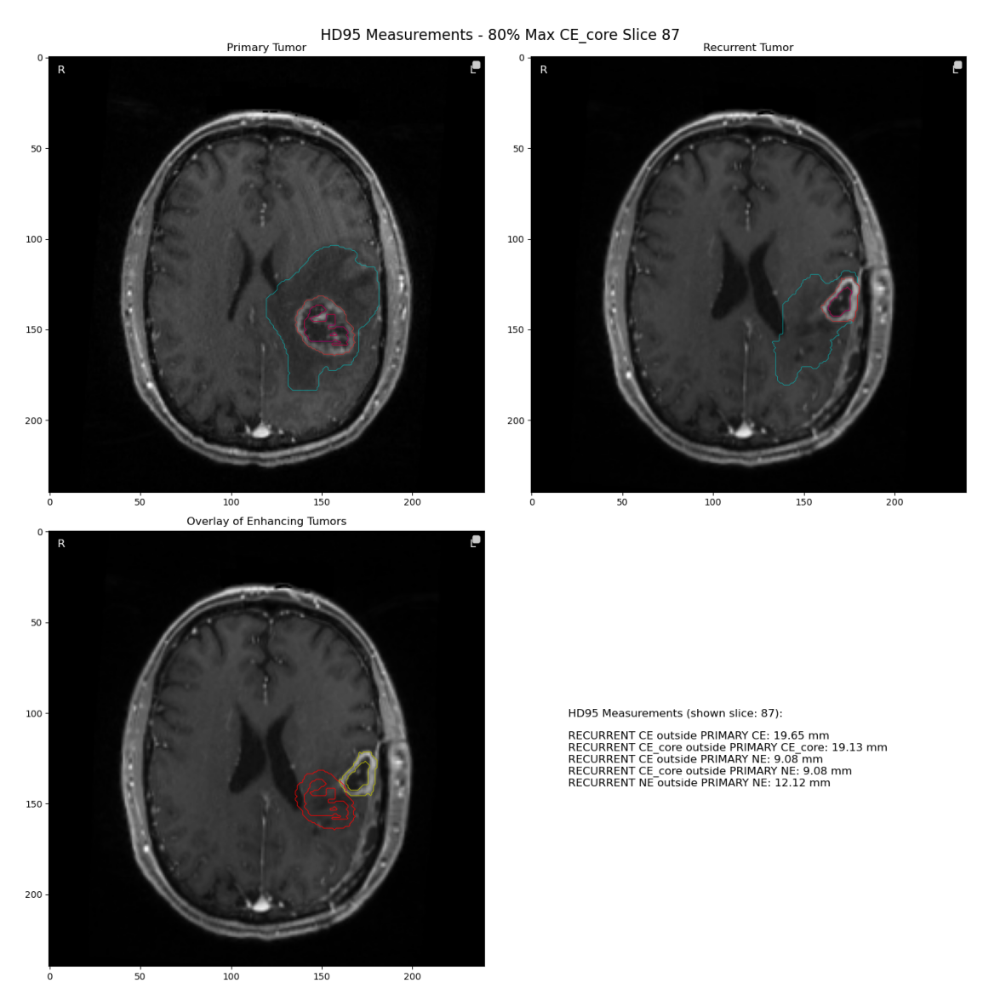

In [21]:
# Main execution code
primary_seg_path = f'{EXAM_DIR}/{y1_list[0]}'
recurrent_seg_path = f'{EXAM_DIR}/{y2_list[0]}'
ct1_primary_path = f'{EXAM_DIR}/{X1_list[0]}'
ct1_recurrent_path = f'{EXAM_DIR}/{X2_list[0]}'

# Compute HD95 measurements
results = compute_multiple_hd95(primary_seg_path, recurrent_seg_path)

# Load the data to find 80% slice
primary_img = nib.load(primary_seg_path)
recurrent_img = nib.load(recurrent_seg_path)
primary_data = primary_img.get_fdata()
recurrent_data = recurrent_img.get_fdata()

# Find the 80% slice
slice_80 = max_80_slice(primary_data, recurrent_data)

# Visualize the result using the 80% slice
output_path = f'{RESULTS}/{site}_{subj}_multiple_hd95_visualization_80pct.png'
visualize_hd95_slice(primary_seg_path, recurrent_seg_path, ct1_primary_path, ct1_recurrent_path, results, output_path, site, custom_slice=slice_80)

print(f"\nVisualization saved to {output_path}")

# Display the image in the notebook
plt.figure(figsize=(15, 15))
img = plt.imread(output_path)
plt.imshow(img)
plt.axis('off')
plt.show()

## Generate visualization in 3D

In [22]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import distance_transform_edt
import plotly.graph_objects as go

def create_3d_comparison_visualization(primary_file, recurrent_file, output_dir=None):
    """
    Create 3D visualization of tumor segmentation differences with HD95 highlights.
    
    Parameters:
    primary_file: str, path to primary tumor segmentation
    recurrent_file: str, path to recurrent tumor segmentation
    output_dir: str, optional directory to save visualizations
    
    Returns:
    plotly figure object
    """
    # Load segmentations
    primary_img = nib.load(primary_file)
    recurrent_img = nib.load(recurrent_file)
    primary_data = primary_img.get_fdata()
    recurrent_data = recurrent_img.get_fdata()
    
    # Create binary masks for each component
    primary_mask = primary_data > 0
    recurrent_mask = recurrent_data > 0
    
    # Calculate distance maps
    dist_map_primary = distance_transform_edt(~primary_mask)
    dist_map_recurrent = distance_transform_edt(~recurrent_mask)
    
    # Find points that contribute to HD95
    threshold = np.percentile(dist_map_primary[recurrent_mask], 95)
    hd95_points = np.where((dist_map_primary > threshold) & recurrent_mask)
    
    # Create the 3D visualization using plotly
    fig = go.Figure()
    
    # Add primary tumor surface
    x, y, z = np.where(primary_mask)
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=2,
            color='blue',
            opacity=0.5
        ),
        name='Primary Tumor'
    ))
    
    # Add recurrent tumor surface
    x, y, z = np.where(recurrent_mask)
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=2,
            color='red',
            opacity=0.5
        ),
        name='Recurrent Tumor'
    ))
    
    # Highlight HD95 points
    x, y, z = hd95_points
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color='yellow',
            opacity=1
        ),
        name='HD95 Points'
    ))
    
    # Update layout
    fig.update_layout(
        title='Tumor Segmentation Comparison with HD95 Highlights',
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        width=800,
        height=800,
        showlegend=True
    )
    
    # Save if output directory provided
    if output_dir:
        import os
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
        fig.write_html(os.path.join(output_dir, 'tumor_comparison_3d.html'))
    
    return fig

def create_slice_visualization(primary_file, recurrent_file, slice_axis=0, slice_num=None):
    """
    Create 2D slice visualization of tumor segmentation differences.
    
    Parameters:
    primary_file: str, path to primary tumor segmentation
    recurrent_file: str, path to recurrent tumor segmentation
    slice_axis: int, axis along which to take the slice (0=sagittal, 1=coronal, 2=axial)
    slice_num: int, optional specific slice number to visualize
    
    Returns:
    matplotlib figure object
    """
    # Load segmentations
    primary_img = nib.load(primary_file)
    recurrent_img = nib.load(recurrent_file)
    primary_data = primary_img.get_fdata()
    recurrent_data = recurrent_img.get_fdata()
    
    # If no slice specified, use middle slice
    if slice_num is None:
        slice_num = primary_data.shape[slice_axis] // 2
    
    # Extract slices
    slicing = [slice(None)] * 3
    slicing[slice_axis] = slice_num
    primary_slice = primary_data[tuple(slicing)]
    recurrent_slice = recurrent_data[tuple(slicing)]
    
    # Create visualization
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Show primary tumor in blue
    ax.contour(primary_slice > 0, colors='blue', levels=[0.5], alpha=0.5, label='Primary')
    
    # Show recurrent tumor in red
    ax.contour(recurrent_slice > 0, colors='red', levels=[0.5], alpha=0.5, label='Recurrent')
    
    # Calculate and show HD95 points for this slice
    dist_map = distance_transform_edt(~(primary_slice > 0))
    threshold = np.percentile(dist_map[recurrent_slice > 0], 95)
    hd95_points = (dist_map > threshold) & (recurrent_slice > 0)
    ax.scatter(*np.where(hd95_points), c='yellow', s=10, label='HD95 Points')
    
    ax.set_title(f'Tumor Comparison ({"Sagittal" if slice_axis==0 else "Coronal" if slice_axis==1 else "Axial"} Slice {slice_num})')
    ax.legend()
    
    return fig

# Example usage:
def visualize_tumor_comparison(primary_file, recurrent_file, output_dir=None):
    """
    Create both 3D and 2D visualizations for tumor comparison.
    
    Parameters:
    primary_file: str, path to primary tumor segmentation
    recurrent_file: str, path to recurrent tumor segmentation
    output_dir: str, optional directory to save visualizations
    """
    # Create 3D visualization
    fig_3d = create_3d_comparison_visualization(primary_file, recurrent_file, output_dir)
    
    # Create 2D visualizations for all three planes
    figs_2d = []
    for axis, name in enumerate(['Sagittal', 'Coronal', 'Axial']):
        fig = create_slice_visualization(primary_file, recurrent_file, slice_axis=axis)
        figs_2d.append(fig)
        if output_dir:
            fig.savefig(os.path.join(output_dir, f'tumor_comparison_{name.lower()}.png'))
    
    return fig_3d, figs_2d

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Visualizations saved to: visualization_output_10_036


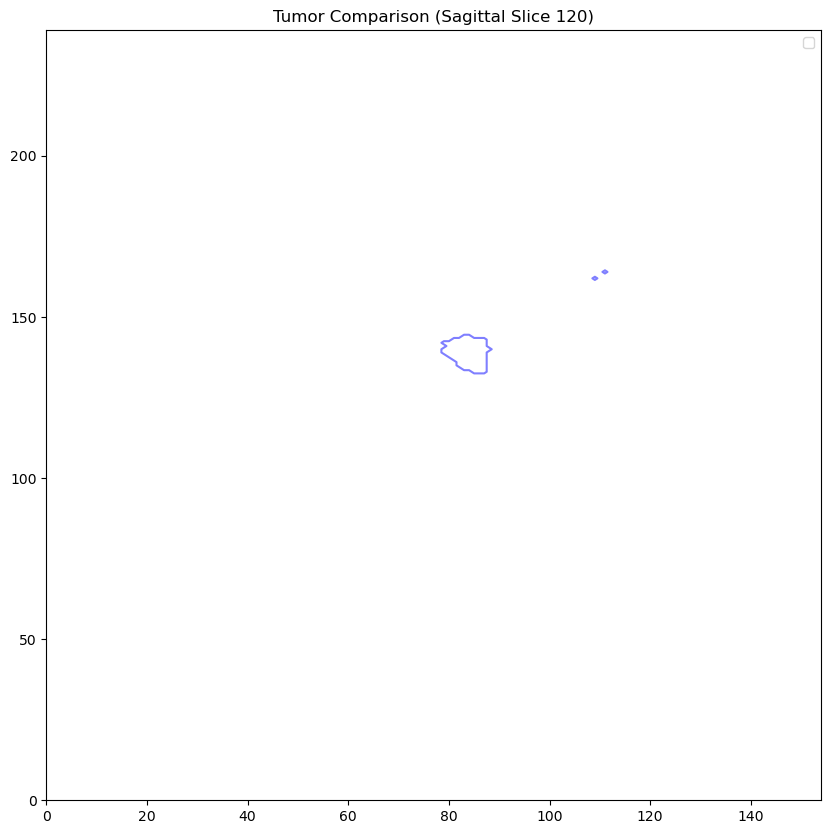

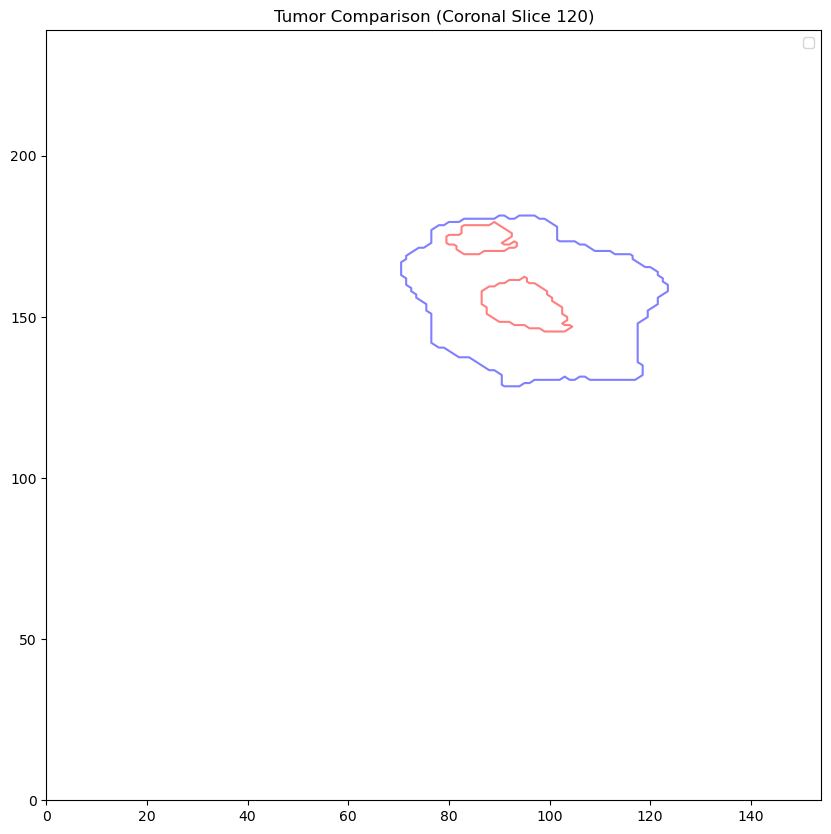

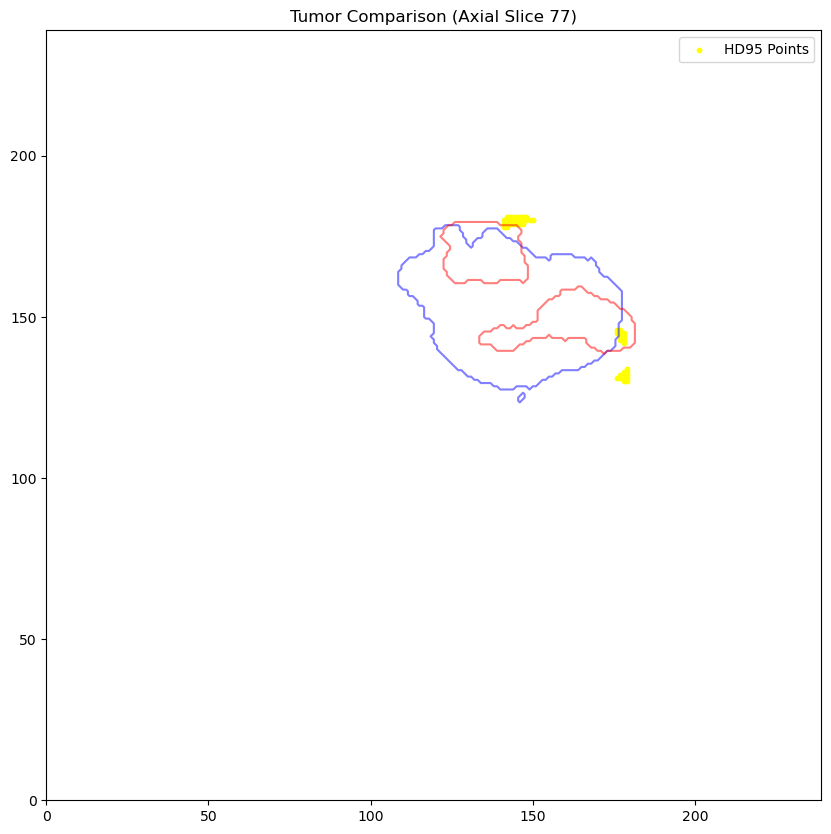

In [25]:
# First select your patient
patient = 1  # Change this value to get info for different patients
site, subj, date1, date2 = get_patient_info(patient, exams_list_site)

def create_slice_visualization(primary_file, recurrent_file, slice_axis=0, slice_num=None):
    """
    Create 2D slice visualization with error handling for empty slices.
    """
    # Load segmentations
    primary_img = nib.load(primary_file)
    recurrent_img = nib.load(recurrent_file)
    primary_data = primary_img.get_fdata()
    recurrent_data = recurrent_img.get_fdata()
    
    # If no slice specified, use middle slice
    if slice_num is None:
        slice_num = primary_data.shape[slice_axis] // 2
    
    # Extract slices
    slicing = [slice(None)] * 3
    slicing[slice_axis] = slice_num
    primary_slice = primary_data[tuple(slicing)]
    recurrent_slice = recurrent_data[tuple(slicing)]
    
    # Create visualization
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Show primary tumor in blue
    ax.contour(primary_slice > 0, colors='blue', levels=[0.5], alpha=0.5, label='Primary')
    
    # Show recurrent tumor in red
    ax.contour(recurrent_slice > 0, colors='red', levels=[0.5], alpha=0.5, label='Recurrent')
    
    # Calculate and show HD95 points for this slice
    dist_map = distance_transform_edt(~(primary_slice > 0))
    recurrent_points = recurrent_slice > 0
    
    # Check if there are any points to calculate percentile
    if np.any(recurrent_points):
        threshold = np.percentile(dist_map[recurrent_points], 95)
        hd95_points = (dist_map > threshold) & recurrent_points
        if np.any(hd95_points):
            ax.scatter(*np.where(hd95_points), c='yellow', s=10, label='HD95 Points')
    
    ax.set_title(f'Tumor Comparison ({"Sagittal" if slice_axis==0 else "Coronal" if slice_axis==1 else "Axial"} Slice {slice_num})')
    ax.legend()
    
    return fig

def visualize_tumor_comparison(primary_file, recurrent_file, output_dir=None):
    """
    Create both 3D and 2D visualizations for tumor comparison.
    """
    # Create output directory if needed
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    try:
        # Create 3D visualization
        fig_3d = create_3d_comparison_visualization(primary_file, recurrent_file, output_dir)
    except Exception as e:
        print(f"Warning: Could not create 3D visualization: {str(e)}")
        fig_3d = None
    
    # Create 2D visualizations for all three planes
    figs_2d = []
    for axis, name in enumerate(['Sagittal', 'Coronal', 'Axial']):
        try:
            fig = create_slice_visualization(primary_file, recurrent_file, slice_axis=axis)
            figs_2d.append(fig)
            if output_dir:
                fig.savefig(os.path.join(output_dir, f'tumor_comparison_{name.lower()}.png'))
        except Exception as e:
            print(f"Warning: Could not create {name} visualization: {str(e)}")
    
    return fig_3d, figs_2d

# Now run the visualization
output_dir = f'visualization_output_{site}_{subj}'
fig_3d, figs_2d = visualize_tumor_comparison(
    primary_seg_path,
    recurrent_seg_path,
    output_dir=output_dir
)

# Display 3D visualization if available
if fig_3d is not None:
    fig_3d.show()

print(f"\nVisualizations saved to: {output_dir}")